Nesse projeto vamos usar o The Breast Cancer Dataset para aplicar alguns modelos de ML e explorar a interpretabilidade e confiabilidade desses modelos.

O conjunto de dados contém 569 amostras de células tumorais malignas e benignas. Contendo 30 características de valor real que foram computadas a partir de imagens digitalizadas dos núcleos celulares, e que podem ser usadas para construir um modelo para prever se um tumor é benigno ou maligno.

**SETTINGS**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd

import numpy as np
import seaborn as sns
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.express as px
import pydotplus #pip install pydotplus
from sklearn.tree import export_graphviz
import time
from subprocess import check_output

### **READING DATASET**

In [ ]:
dataset = pd.read_csv('/content/drive/MyDrive/responsibleia/dataset.csv', delimiter = ",")
#dataset = pd.read_csv('/content/drive/MyDrive/datasets/dataset.csv', delimiter = ",")

dataset.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


**ANALYZING DATASET**

> Antes de fazer qualquer coisa como seleção, extração e classificação de recursos, primeiro começamos com a análise básica dos dados.



In [ ]:
dataset.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [ ]:
# Check the number of unique values of each column
dataset.nunique()

id                         569
diagnosis                    2
radius_mean                456
texture_mean               479
perimeter_mean             522
area_mean                  539
smoothness_mean            474
compactness_mean           537
concavity_mean             537
concave points_mean        542
symmetry_mean              432
fractal_dimension_mean     499
radius_se                  540
texture_se                 519
perimeter_se               533
area_se                    528
smoothness_se              547
compactness_se             541
concavity_se               533
concave points_se          507
symmetry_se                498
fractal_dimension_se       545
radius_worst               457
texture_worst              511
perimeter_worst            514
area_worst                 544
smoothness_worst           411
compactness_worst          529
concavity_worst            539
concave points_worst       492
symmetry_worst             500
fractal_dimension_worst    535
Unnamed:

In [ ]:
dataset.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [ ]:
# Check Duplication
dataset.duplicated().sum()

0

**Observações Iniciais:**

1. **'diagnosis' como Rótulo de Classe:** A variável de diagnóstico é nosso rótulo de classe, indicando se um tumor é maligno (M) ou benigno (B).

2. **Variáveis numéricas:** A maioria das colunas parece ter uma entrada numérica. Isso economizará nosso tempo mapeando as variáveis.

3. **'id' irrelevante:** Existe uma coluna de ID que não é relevante para a classificação e não deve ser usada como recurso.

4. **'Unnamed: 32':** A coluna 32 parece não ter um nome e inclui NaN. Portanto, não precisamos dela para nossa análise.


In [ ]:
# Eliminating the 'id' and 'Unnamed: 32' columns which will not provide any information to our model
dataset = dataset.drop(['id','Unnamed: 32'], axis= 1)

dataset.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
target=dataset[['diagnosis']].value_counts(normalize=True).sort_index().round(decimals=3)*100

pal, color=['#e60000','#FAFAD2'], ['#e60000','#FAFAD2']
fig=go.Figure()

fig.add_trace(go.Pie(labels=target.index, values=target, hole=.5,
                     showlegend=True,sort=False,
                     marker=dict(colors=color,line=dict(color=pal,width=2.5)),
                     hovertemplate = "%{label} Transported: %{value:.2f}%<extra></extra>"))

fig.update_layout(template='plotly_dark', title='Target Distribution',
                  legend=dict(traceorder='reversed',y=1.05,x=0),
                  uniformtext_minsize=15, uniformtext_mode='hide',height=500)

---
> Para entender um pouco melhor a correlação entre as features e entre o target, vamos analisar os dois gráficos na seguência:

In [ ]:
dataset.diagnosis.replace({"M": 1, "B": 0}, inplace=True)

correlation_with_target = dataset.drop('diagnosis', axis=1).corrwith(dataset.diagnosis)

fig = px.bar(
    x=correlation_with_target.index,
    y=correlation_with_target.values,
    labels={'x': 'Features', 'y': 'Correlation with Target'},
    title='Correlation with Target',
    color=correlation_with_target.values,
    color_continuous_scale='Viridis',
)

fig.update_layout(
    xaxis=dict(tickangle=45),
    yaxis=dict(title='Correlation'),
    coloraxis_colorbar=dict(title='Correlation'),
    template='plotly_dark',
)

fig.show()


dataset.diagnosis.replace({1: "M", 0: "B"}, inplace=True)




O plot de correlação acima contribui para a identificação de características fortemente associadas ao diagnóstico, revelando quais têm maior impacto na diferenciação entre classes.


> O que pode ser notado é que existem apenas algumas colunas que mostram correlação negativa com a coluna de diagnóstico. E cerca da metade delas tem mais de 50% de correlação positiva com o target.



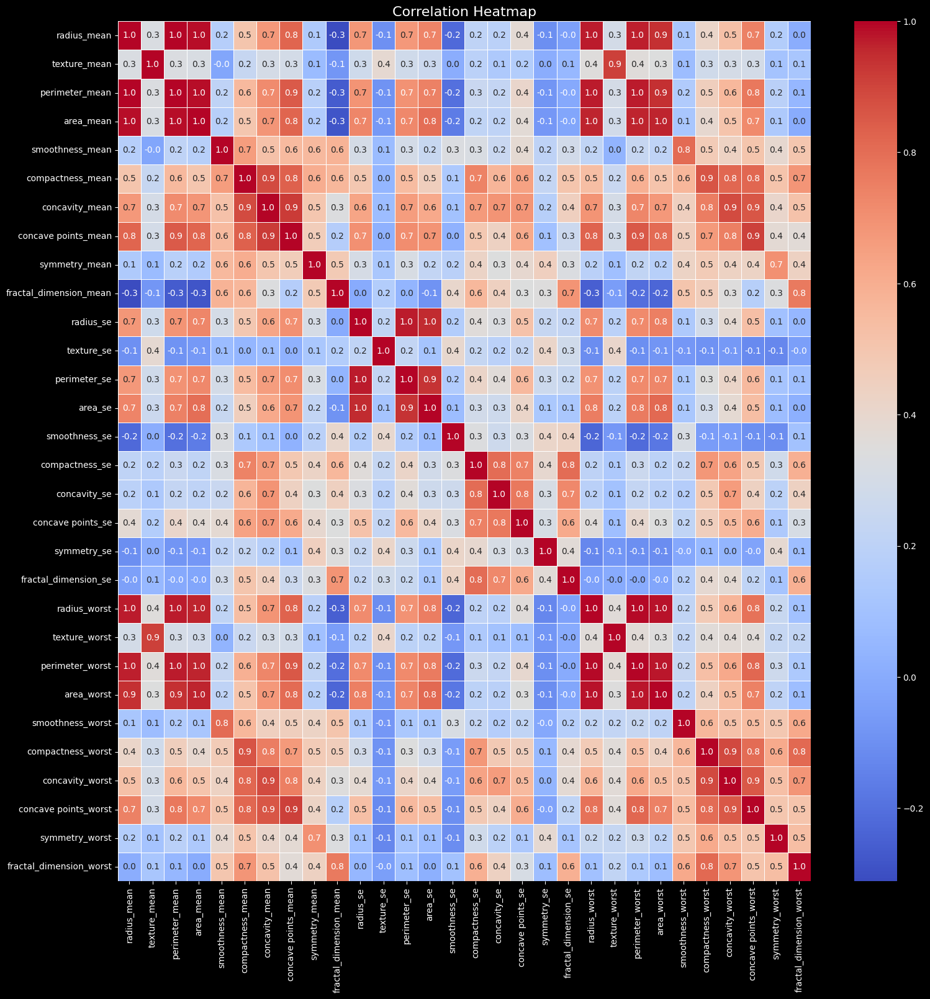

In [ ]:
#correlation map
X = dataset.drop(['diagnosis'], axis=1)

plt.style.use('dark_background')

f, ax = plt.subplots(figsize=(18, 18))
sns.heatmap(X.corr(), annot=True, linewidths=.5, fmt='.1f', ax=ax, cmap='coolwarm')

plt.title('Correlation Heatmap', fontsize=16, color='white')

plt.show()

O heatmap é útil para resumir visualmente as relações entre as variáveis em conjuntos de dados complexos como o nosso.


> O que pode ser percebido que é existem muitas funções altamente correlacionadas, então podemos dizer com segurança que temos multicolinearidade em nossos dados. Mas isso seria um problema? Não necessariamente. Vai depender de como um modelo se relacioana com os dados, por exemplo, na Regressão Linear isso pode ser um problema pois as correlações podem influenciar nos pesos da previsão. Já no Randem Forest essa multicolinearidade é melhor interpretada.

Para ajudar na nossa interpretabilidade vamos remover alguns variáveis com alto grau de correlação.

In [ ]:
X_drop = ['perimeter_mean','radius_mean','compactness_mean','concave points_mean',
              'radius_se','perimeter_se','radius_worst','perimeter_worst','compactness_worst',
              'concave points_worst','compactness_se','concave points_se','texture_worst','area_worst']

X_fs = X.drop(X_drop,axis = 1 )
X_fs.head()

,texture_mean,area_mean,smoothness_mean,concavity_mean,symmetry_mean,fractal_dimension_mean,texture_se,area_se,smoothness_se,concavity_se,symmetry_se,fractal_dimension_se,smoothness_worst,concavity_worst,symmetry_worst,fractal_dimension_worst
0,10.38,1001.0,0.11840,0.3001,0.2419,0.07871,0.9053,153.40,0.006399,0.05373,0.03003,0.006193,0.1622,0.7119,0.4601,0.11890
1,17.77,1326.0,0.08474,0.0869,0.1812,0.05667,0.7339,74.08,0.005225,0.01860,0.01389,0.003532,0.1238,0.2416,0.2750,0.08902
2,21.25,1203.0,0.10960,0.1974,0.2069,0.05999,0.7869,94.03,0.006150,0.03832,0.02250,0.004571,0.1444,0.4504,0.3613,0.08758
3,20.38,386.1,0.14250,0.2414,0.2597,0.09744,1.1560,27.23,0.009110,0.05661,0.05963,0.009208,0.2098,0.6869,0.6638,0.17300
4,14.34,1297.0,0.10030,0.1980,0.1809,0.05883,0.7813,94.44,0.011490,0.05688,0.01756,0.005115,0.1374,0.4000,0.2364,0.07678


<Axes: >

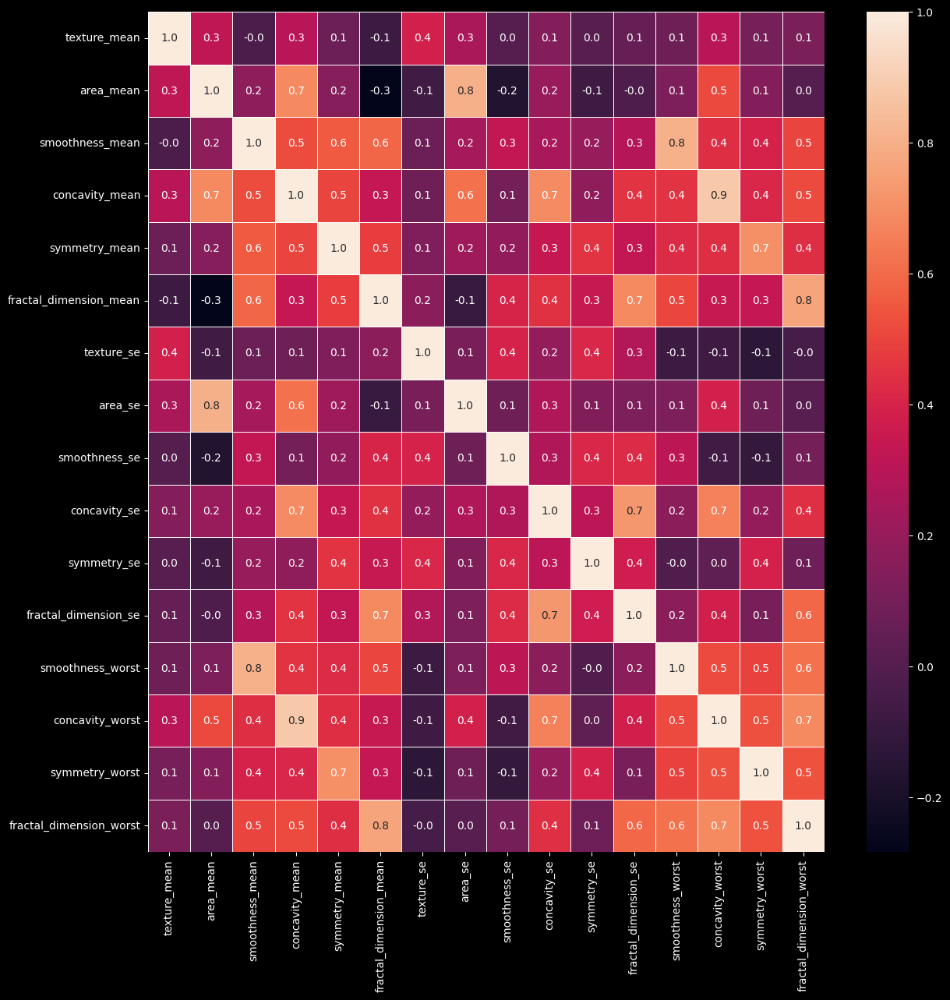

In [ ]:
#correlation map
f,ax = plt.subplots(figsize=(14, 14))
sns.heatmap(X_fs.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)

> Agora a multicolinearidade foi reduzida e interpretabilidade tende a ser facilidade com a reduação de quase metade das features anteriores.
---

### **TRAINING AND TEST MODELS**
> 1. Escolha de uma das colunas para classificação
>2. Separação dos dados em treinamento, validação e teste

In [ ]:
from sklearn.model_selection import train_test_split

X = X_fs
Y = dataset['diagnosis']

Y

0      M
1      M
2      M
3      M
4      M
      ..
564    M
565    M
566    M
567    M
568    B
Name: diagnosis, Length: 569, dtype: object

In [ ]:
# Separando os dados em treinamento(70%) e teste(15%) e validação(15%)
X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, test_size=0.30, random_state=42)
X_val, X_test, Y_val, Y_test = train_test_split(X_temp, Y_temp, test_size=0.50, random_state=42)

X_train

,texture_mean,area_mean,smoothness_mean,concavity_mean,symmetry_mean,fractal_dimension_mean,texture_se,area_se,smoothness_se,concavity_se,symmetry_se,fractal_dimension_se,smoothness_worst,concavity_worst,symmetry_worst,fractal_dimension_worst
149,17.91,585.0,0.07944,0.02881,0.1473,0.05580,0.7574,21.47,0.002838,0.017800,0.01329,0.001976,0.09711,0.15640,0.2350,0.07014
124,16.39,553.5,0.07115,0.08092,0.1422,0.05823,1.1400,14.66,0.005919,0.049570,0.01208,0.004076,0.10250,0.33080,0.2048,0.07628
421,13.98,656.1,0.10310,0.14500,0.2086,0.07406,1.5110,49.45,0.009976,0.052780,0.02653,0.005444,0.13120,0.32190,0.2827,0.09208
195,16.33,516.4,0.07941,0.03873,0.1829,0.05667,0.9086,15.75,0.005298,0.023210,0.01853,0.002152,0.10970,0.17640,0.3024,0.06949
545,23.23,573.2,0.09246,0.02974,0.1664,0.05801,1.3360,31.24,0.005868,0.020210,0.02087,0.002583,0.12160,0.10490,0.2642,0.06953
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,14.64,244.0,0.09783,0.08606,0.1902,0.08980,0.8522,25.44,0.017210,0.056710,0.02541,0.021930,0.12070,0.14340,0.2254,0.10840
106,18.33,412.5,0.11420,0.07070,0.1801,0.06520,1.6570,20.62,0.008540,0.029450,0.01565,0.003840,0.16880,0.28730,0.2806,0.09097
270,16.82,632.6,0.06429,0.00725,0.1508,0.05376,0.7198,10.77,0.003492,0.004826,0.01536,0.001381,0.08567,0.03866,0.2458,0.06120
435,19.62,599.5,0.10600,0.11260,0.1669,0.06544,0.9533,18.85,0.005314,0.021850,0.01223,0.002846,0.16130,0.40690,0.3179,0.10550


### **Classifiers**
> 3. Separar 4 algoritmos de acordo com a tarefa escolhida (classificação)

> Agora, vamos aplicar diversos modelos, abrangendo tanto abordagens 'caixa preta' quanto 'caixa branca', com o objetivo de obter métricas de desempenho em nosso conjunto de dados. Posteriormente, identificaremos alguns desses modelos para futuras aplicações de técnicas de interpretabilidade e confiabilidade.

#### **BLACK BOX MODELS**

##### **LEARNING A RANDOM FOREST MODEL**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()

rf.fit(X_train, Y_train)

Yhat_rf = rf.predict(X_test)

##### **LEARNING A KNN MODEL**

--- CROSS VALIDATION FOR K

Text(0, 0.5, 'Accuracy Score')

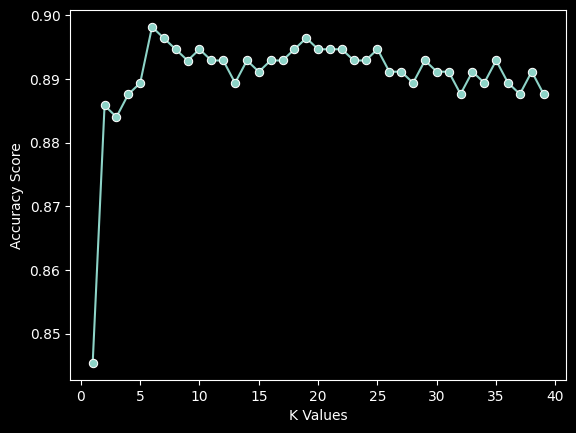

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier

k_values = [i for i in range (1,40)]
scores = []

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    score = cross_val_score(knn, X, Y, cv=4)
    scores.append(np.mean(score))


sns.lineplot(x = k_values, y = scores, marker = 'o')
plt.xlabel("K Values")
plt.ylabel("Accuracy Score")

In [ ]:
best_index = np.argmax(scores)
best_k = k_values[best_index]

knn = KNeighborsClassifier(n_neighbors=best_k,  weights='distance')

knn.fit(X_train, Y_train)

Yhat_knn = knn.predict(X_test)

#### **WHITE BOX MODELS**

##### **LEARNING A DECISION TREE**

In [ ]:
def tree_graph_to_png(tree, feature_names, png_file_to_save):
    tree_str = export_graphviz(tree, feature_names=feature_names,
                                     filled=True, out_file=None)
    graph = pydotplus.graph_from_dot_data(tree_str)
    graph.write_png(png_file_to_save)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(criterion = 'entropy',max_depth = 2,min_samples_leaf = 30)

dt.fit(X_train, Y_train)

Yhat_dt = dt.predict(X_test)


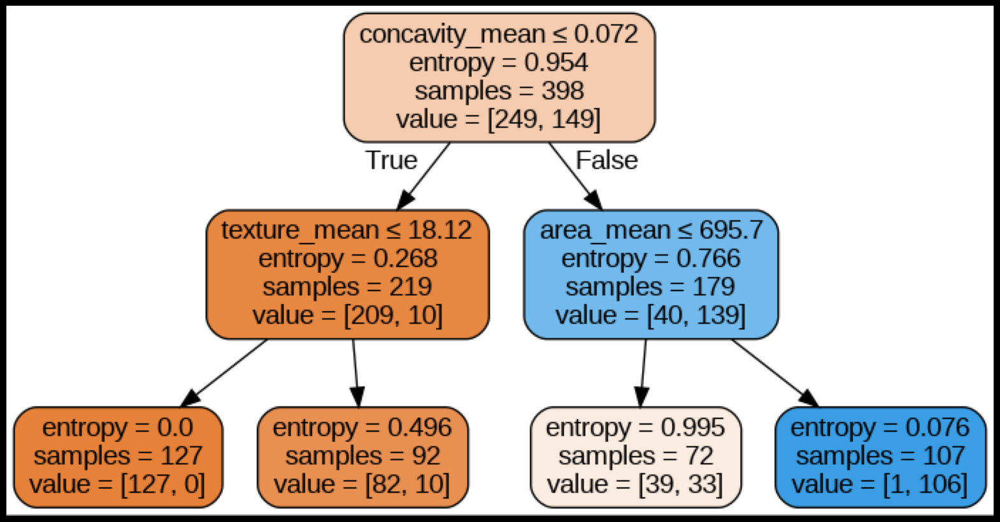

In [ ]:
import graphviz
from PIL import Image

# Função para salvar o gráfico de árvore de decisão como uma imagem PNG
def tree_graph_to_png(tree, feature_names, png_file_to_save):
    dot_data = export_graphviz(tree, out_file=None,
                               feature_names=feature_names,
                               filled=True, rounded=True,
                               special_characters=True)
    graph = graphviz.Source(dot_data)
    graph.render(png_file_to_save, format='png')
    img = Image.open(png_file_to_save + '.png')
    return img

img = tree_graph_to_png(dt, feature_names=X_train.columns, png_file_to_save='dt')

plt.figure(figsize=(20, 20))
plt.imshow(img)
plt.axis('off')
plt.show()

##### **LEARNING A LOGISTIC REGRESSION MODEL**

<ipython-input-24-b1ce3455913b>:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




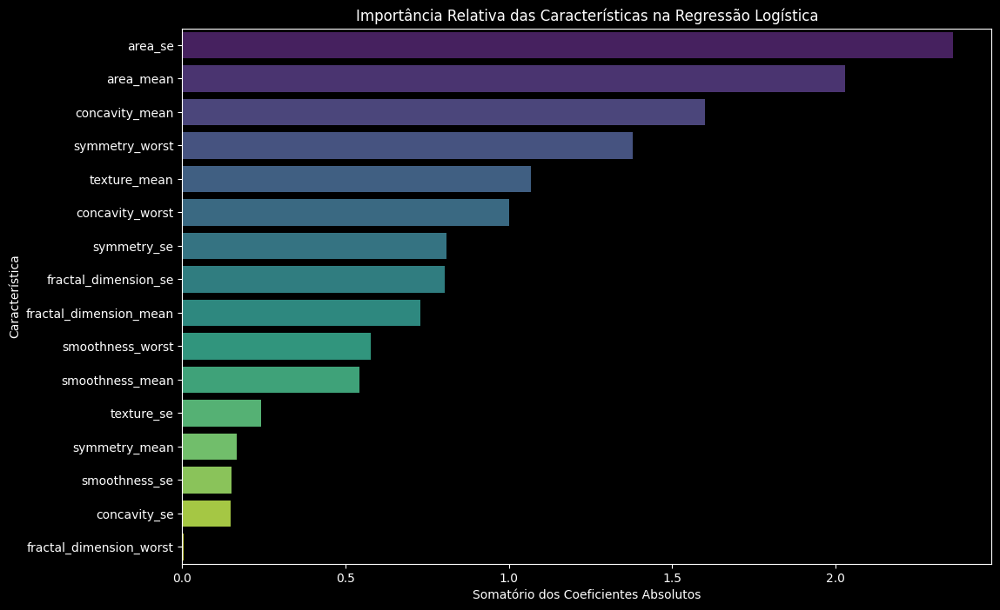

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

lr = make_pipeline(StandardScaler(), LogisticRegression(max_iter=1000))

lr.fit(X_train, Y_train)

Yhat_lr = lr.predict(X_test)

# Extrair coeficientes e organizá-los em um DataFrame
coeficients = pd.DataFrame(lr.named_steps['logisticregression'].coef_, columns=X.columns)

# Plotar os coeficientes
plt.figure(figsize=(12, 8))
sns.barplot(data=coeficients.transpose().abs().sum(axis=1).sort_values(ascending=False).reset_index(),
            x=0, y='index', palette='viridis')
plt.title('Importância Relativa das Características na Regressão Logística')
plt.xlabel('Somatório dos Coeficientes Absolutos')
plt.ylabel('Característica')
plt.show()


#### **TEST**

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc

metrics = pd.DataFrame(index = ['dt','rf','lr','knn'], columns = ['Acc','Prec','Rec','F1','AUC','AUPR'])

metrics.at['dt','Acc'] = accuracy_score(Y_test,Yhat_dt)
metrics.at['rf','Acc'] = accuracy_score(Y_test,Yhat_rf)
metrics.at['lr','Acc'] = accuracy_score(Y_test,Yhat_lr)
metrics.at['knn','Acc'] = accuracy_score(Y_test,Yhat_knn)

metrics.at['dt','Prec'] = precision_score(Y_test,Yhat_dt,pos_label='M')
metrics.at['rf','Prec'] = precision_score(Y_test,Yhat_rf,pos_label='M')
metrics.at['lr','Prec'] = precision_score(Y_test,Yhat_lr,pos_label='M')
metrics.at['knn','Prec'] = precision_score(Y_test,Yhat_knn,pos_label='M')

metrics.at['dt','Rec'] = recall_score(Y_test,Yhat_dt,pos_label='M')
metrics.at['rf','Rec'] = recall_score(Y_test,Yhat_rf,pos_label='M')
metrics.at['lr','Rec'] = recall_score(Y_test,Yhat_lr,pos_label='M')
metrics.at['knn','Rec'] = recall_score(Y_test,Yhat_knn,pos_label='M')

metrics.at['dt','F1'] = f1_score(Y_test,Yhat_dt,pos_label='M')
metrics.at['rf','F1'] = f1_score(Y_test,Yhat_rf,pos_label='M')
metrics.at['lr','F1'] = f1_score(Y_test,Yhat_lr,pos_label='M')
metrics.at['knn','F1'] = f1_score(Y_test,Yhat_knn,pos_label='M')

metrics.at['dt','AUC'] = roc_auc_score(Y_test,dt.predict_proba(X_test)[:, 1])
metrics.at['rf','AUC'] = roc_auc_score(Y_test,rf.predict_proba(X_test)[:, 1])
metrics.at['lr','AUC'] = roc_auc_score(Y_test,lr.predict_proba(X_test)[:, 1])
metrics.at['knn','AUC'] = roc_auc_score(Y_test,knn.predict_proba(X_test)[:, 1])

precision, recall, thresholds = precision_recall_curve(Y_test, dt.predict_proba(X_test)[:, 1],pos_label = 'M')
metrics.at['dt','AUPR'] = auc_score = auc(recall, precision)
precision, recall, thresholds = precision_recall_curve(Y_test, rf.predict_proba(X_test)[:, 1],pos_label = 'M')
metrics.at['rf','AUPR'] = auc_score = auc(recall, precision)
precision, recall, thresholds = precision_recall_curve(Y_test, lr.predict_proba(X_test)[:, 1],pos_label = 'M')
metrics.at['lr','AUPR'] = auc_score = auc(recall, precision)
precision, recall, thresholds = precision_recall_curve(Y_test, knn.predict_proba(X_test)[:, 1],pos_label = 'M')
metrics.at['knn','AUPR'] = auc_score = auc(recall, precision)

metrics



,Acc,Prec,Rec,F1,AUC,AUPR
dt,0.895349,1.0,0.653846,0.790698,0.934615,0.910821
rf,0.976744,1.0,0.923077,0.96,0.999359,0.998626
lr,0.976744,0.928571,1.0,0.962963,0.996795,0.992121
knn,0.883721,0.807692,0.807692,0.807692,0.980769,0.961165


Fica evidente que o Random Forest e a Regressão Logística apresentaram alto desempenho, atingindo altas pontuações em várias métricas, indicando sua eficácia na tarefa de classificação do conjunto de dados.

> Imagino que pelo fato do Random Forest ser um ensemble de árvores de decisão, ajuda a capturar as relações complexas entre as características.

> No caso da Regressão Linear, pode indicar que as relações entre as características e a variável de destino são aproximadamente lineares.

---

##### Curva ROC e Confusion Matrix

Aqui optei por analisar a curva ROC e a matriz de confusão apenas do Random Forest e Regressão Linear por terem as melhores métricas, como acabamos de ver.

A ideia de usar a curva ROC é mostrar a relação entre a taxa de verdadeiros positivos e a taxa de falsos positivos para diferentes limiares de decisão.
> Um AUC de 1 indica um modelo perfeito, enquanto um AUC de 0.5 indica um modelo que não é melhor que o acaso.

###### RF

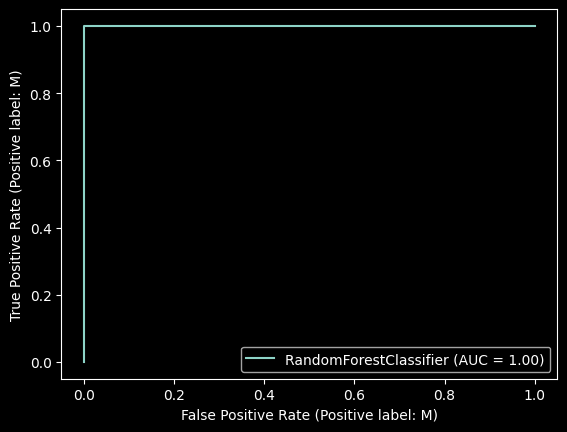

In [ ]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(rf, X_test, Yhat_rf)

plt.show()

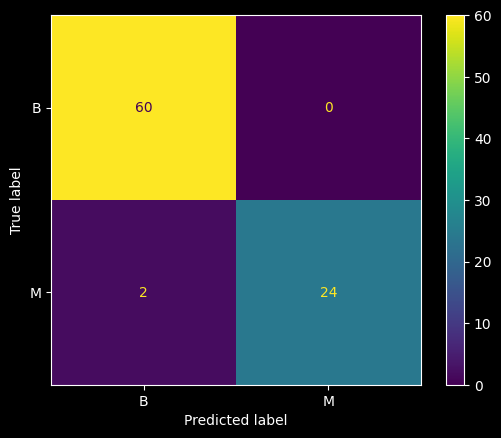

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm_rf = confusion_matrix(Y_test, Yhat_rf, labels=dt.classes_)

disp = ConfusionMatrixDisplay(confusion_matrix=cm_rf,display_labels=dt.classes_)

disp.plot()

plt.show()

###### LR

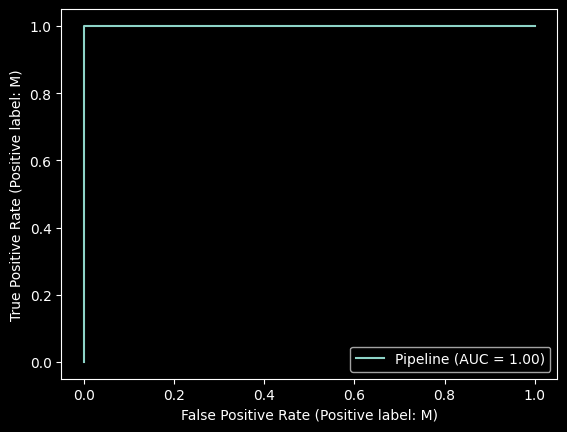

In [ ]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(lr, X_test, Yhat_lr)

plt.show()

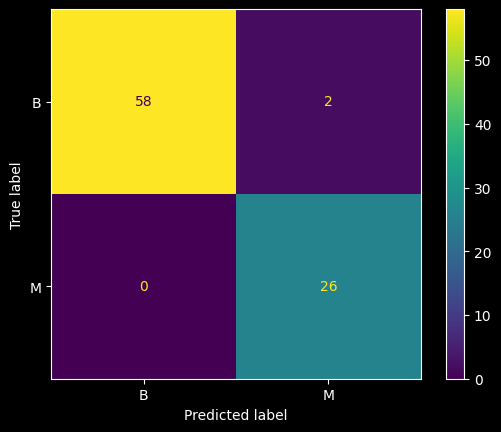

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm_lr = confusion_matrix(Y_test, Yhat_lr, labels=dt.classes_)

disp = ConfusionMatrixDisplay(confusion_matrix=cm_lr,display_labels=dt.classes_)

disp.plot()

plt.show()

### MLFlow
> 4. Adicionar MLFlow no treinamento dos modelos para rastreamento

In [ ]:
!pip install -q mlflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.8/25.8 MB 32.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.0/233.0 kB 23.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 kB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 16.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.2/128.2 kB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.9/59.9 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.0/107.0 kB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.4/84.4 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.9/202.9 kB 22.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━

In [ ]:
import mlflow
import mlflow.sklearn
import logging
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from urllib.parse import urlparse

In [ ]:
logging.basicConfig(level=logging.WARN)
logger = logging.getLogger(__name__)

In [ ]:
def eval_metrics(actual, pred):
    ac = accuracy_score(Y_test, pred)
    ps = precision_score(Y_test, pred, average='macro')
    rc = recall_score(Y_test, pred, average='macro')

    return ac, ps, rc

In [ ]:
def save_model_in_mlflow(model, y_pred, model_name):
    mlflow.set_experiment(model_name)
    with mlflow.start_run():
        ac, ps, rc = eval_metrics(Y_test, y_pred)

        mlflow.log_metric("accuracy", ac)
        mlflow.log_metric("precision", ps)
        mlflow.log_metric("recall", rc)

        tracking_url_type_store = urlparse(mlflow.get_tracking_uri()).scheme
        mlflow.sklearn.log_model(model, "model", registered_model_name=model_name)

In [ ]:
!pip install -q pyngrok

In [ ]:
from pyngrok import ngrok

ngrok.kill()

NGROK_AUTH_TOKEN = "2j51eE4AuT7xKdXH14vU1Py9fsV_3QFV9Ua49FxzPUFVH58WX"
ngrok.set_auth_token(NGROK_AUTH_TOKEN)

ngrok_tunnel = ngrok.connect(addr="5000", proto="http", bind_tls=True)
print("MLflow Tracking UI:", ngrok_tunnel.public_url)

MLflow Tracking UI: https://6b9b-34-125-104-66.ngrok-free.app


In [ ]:
!mlflow ui

[2024-07-11 21:39:37 +0000] [5626] [INFO] Starting gunicorn 22.0.0
[2024-07-11 21:39:37 +0000] [5626] [INFO] Listening at: http://127.0.0.1:5000 (5626)
[2024-07-11 21:39:37 +0000] [5626] [INFO] Using worker: sync
[2024-07-11 21:39:37 +0000] [5627] [INFO] Booting worker with pid: 5627
[2024-07-11 21:39:37 +0000] [5628] [INFO] Booting worker with pid: 5628
[2024-07-11 21:39:37 +0000] [5629] [INFO] Booting worker with pid: 5629
[2024-07-11 21:39:37 +0000] [5630] [INFO] Booting worker with pid: 5630
[2024-07-11 21:40:47 +0000] [5626] [INFO] Handling signal: int

Aborted!
[2024-07-11 21:40:47 +0000] [5628] [INFO] Worker exiting (pid: 5628)
[2024-07-11 21:40:47 +0000] [5629] [INFO] Worker exiting (pid: 5629)
[2024-07-11 21:40:47 +0000] [5630] [INFO] Worker exiting (pid: 5630)
[2024-07-11 21:40:47 +0000] [5627] [INFO] Worker exiting (pid: 5627)
[2024-07-11 21:40:48 +0000] [5626] [INFO] Shutting down: Master


### Hiper-parâmetros
> 5. Executar uma ferramenta de seleção de hiper-parâmetros sobre o conjunto de validação

Escolhemos o optuna por ser mais inteligente e performático do que o grid search

In [ ]:
!pip install -q optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 5.9 MB/s eta 0:00:00


In [ ]:
import optuna

#### Definir parâmetros da DT

Os parametros escolhidos para análise e definição foram, criterion e splitter

In [ ]:
def objective(trial):
    criterion = trial.suggest_categorical('criterion', ['gini', 'entropy', 'log_loss'])
    splitter = trial.suggest_categorical('splitter', ['best', 'random'])

    dt = DecisionTreeClassifier(random_state=42,
                        criterion=criterion,
                        splitter=splitter).fit(X_train, Y_train)

    predictions = dt.predict(X_val)
    acc = accuracy_score(Y_val, predictions)

    return acc

In [ ]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=20)

[I 2024-07-11 21:38:48,735] A new study created in memory with name: no-name-964f307e-26dd-4abf-b09a-7a892388952e
[I 2024-07-11 21:38:48,754] Trial 0 finished with value: 0.8941176470588236 and parameters: {'criterion': 'log_loss', 'splitter': 'random'}. Best is trial 0 with value: 0.8941176470588236.
[I 2024-07-11 21:38:48,770] Trial 1 finished with value: 0.9764705882352941 and parameters: {'criterion': 'entropy', 'splitter': 'best'}. Best is trial 1 with value: 0.9764705882352941.
[I 2024-07-11 21:38:48,783] Trial 2 finished with value: 0.8941176470588236 and parameters: {'criterion': 'log_loss', 'splitter': 'random'}. Best is trial 1 with value: 0.9764705882352941.
[I 2024-07-11 21:38:48,803] Trial 3 finished with value: 0.9764705882352941 and parameters: {'criterion': 'log_loss', 'splitter': 'best'}. Best is trial 1 with value: 0.9764705882352941.
[I 2024-07-11 21:38:48,819] Trial 4 finished with value: 0.9764705882352941 and parameters: {'criterion': 'log_loss', 'splitter': 'best

In [ ]:
print(f"Melhores hiperparâmetros: {study.best_params}")
print(f"Melhor valor de acurácia: {study.best_value}")

Melhores hiperparâmetros: {'criterion': 'entropy', 'splitter': 'best'}
Melhor valor de acurácia: 0.9764705882352941


Rodando a DecisionTree para os melhores parâmetros e para o conjunto de teste

In [ ]:
dt = DecisionTreeClassifier(random_state=42,
                        criterion='entropy',
                        splitter='best').fit(X_train, Y_train)

predictions = dt.predict(X_test)
predictions_proba = dt.predict_proba(X_test)

In [ ]:
save_model_in_mlflow(dt, predictions, "DecisionTree")

2024/07/11 21:38:49 INFO mlflow.tracking.fluent: Experiment with name 'DecisionTree' does not exist. Creating a new experiment.
/usr/local/lib/python3.10/dist-packages/_distutils_hack/__init__.py:33: UserWarning:

Setuptools is replacing distutils.

Successfully registered model 'DecisionTree'.
Created version '1' of model 'DecisionTree'.


#### Definir parâmetros do KNN

Parâmetros:

1. n_neighbors: Um número inteiro entre 1 e 10, sugerido pelo Optuna para determinar o número de vizinhos mais próximos no algoritmo k-nearest neighbors.

2. weights: Uma escolha categórica entre 'uniform' e 'distance', sugerida pelo Optuna para decidir como os vizinhos são ponderados no processo de classificação.

3. algorithm: Uma escolha categórica entre 'auto', 'ball_tree', 'kd_tree', e 'brute', sugerida pelo Optuna para o algoritmo utilizado para computar os vizinhos mais próximos.

In [ ]:
def objective(trial):
    n_neighbors = trial.suggest_int('n_neighbors', 1, 10)
    weights = trial.suggest_categorical('weights', ['uniform', 'distance'])
    algorithm = trial.suggest_categorical('algorithm', ['ball_tree', 'kd_tree', 'brute'])

    knn = KNeighborsClassifier(n_neighbors=n_neighbors, weights=weights, algorithm=algorithm)
    knn.fit(X_train, Y_train)

    predictions = knn.predict(X_val)
    acc_knn = accuracy_score(Y_val, predictions)

    return acc_knn




In [ ]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=20)

[I 2024-07-11 21:38:53,923] A new study created in memory with name: no-name-6fb12771-0c97-4dda-aa16-abaa955ca365
[I 2024-07-11 21:38:53,936] Trial 0 finished with value: 0.8941176470588236 and parameters: {'n_neighbors': 4, 'weights': 'distance', 'algorithm': 'kd_tree'}. Best is trial 0 with value: 0.8941176470588236.
[I 2024-07-11 21:38:53,959] Trial 1 finished with value: 0.9058823529411765 and parameters: {'n_neighbors': 9, 'weights': 'uniform', 'algorithm': 'brute'}. Best is trial 1 with value: 0.9058823529411765.
[I 2024-07-11 21:38:53,976] Trial 2 finished with value: 0.9058823529411765 and parameters: {'n_neighbors': 9, 'weights': 'uniform', 'algorithm': 'brute'}. Best is trial 1 with value: 0.9058823529411765.
[I 2024-07-11 21:38:53,989] Trial 3 finished with value: 0.8941176470588236 and parameters: {'n_neighbors': 8, 'weights': 'distance', 'algorithm': 'ball_tree'}. Best is trial 1 with value: 0.9058823529411765.
[I 2024-07-11 21:38:54,000] Trial 4 finished with value: 0.894

In [ ]:
print(f"Melhores hiperparâmetros: {study.best_params}")
print(f"Melhor valor de acurácia: {study.best_value}")

Melhores hiperparâmetros: {'n_neighbors': 9, 'weights': 'uniform', 'algorithm': 'brute'}
Melhor valor de acurácia: 0.9058823529411765


Rodandoo o KNN com os melhores parâmetros e para o conjunto de teste

In [ ]:
knn = KNeighborsClassifier(n_neighbors=7, weights='uniform', algorithm='brute')
knn.fit(X_train, Y_train)

predictions = knn.predict(X_test)
predictions_proba = knn.predict_proba(X_test)

In [ ]:
save_model_in_mlflow(knn, predictions, "Knn")

2024/07/11 21:38:54 INFO mlflow.tracking.fluent: Experiment with name 'Knn' does not exist. Creating a new experiment.
Successfully registered model 'Knn'.
Created version '1' of model 'Knn'.


#### Definir parâmetros da LogisticRegression

Os parâmetros escolhidos para análise foram:

1. penalty: Uma escolha categórica entre l2 e none. Este parâmetro controla o tipo de penalidade aplicada durante a regularização do modelo.

2. C: Um parâmetro contínuo com distribuição loguniforme entre 1e-4 e 1e4. Este parâmetro controla a força da regularização aplicada ao modelo.

In [ ]:
def objective(trial):
    penalty = trial.suggest_categorical('penalty', ['l2', 'none'])
    C = trial.suggest_loguniform('C', 1e-4, 1e4)

    lr = LogisticRegression(penalty=penalty, C=C, solver='lbfgs', random_state=42)
    lr.fit(X_train, Y_train)

    predictions = lr.predict(X_val)
    acc = accuracy_score(Y_val, predictions)

    return acc

In [ ]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=20)

[I 2024-07-11 21:38:57,778] A new study created in memory with name: no-name-5c11f3e7-955b-4b62-a06a-94a5017d6a90
<ipython-input-51-3abd3bbf6e8a>:3: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

[I 2024-07-11 21:38:57,826] Trial 0 finished with value: 0.9294117647058824 and parameters: {'penalty': 'l2', 'C': 0.16885746443777416}. Best is trial 0 with value: 0.9

In [ ]:
print(f"Melhores hiperparâmetros: {study.best_params}")
print(f"Melhor valor de acurácia: {study.best_value}")

Melhores hiperparâmetros: {'penalty': 'l2', 'C': 2963.772973762265}
Melhor valor de acurácia: 0.9764705882352941


Rodando o LogisticRegression para os melhores parâmetros e para o conjunto de teste

In [ ]:
best_params = study.best_params
lr = LogisticRegression(penalty=best_params['penalty'], C=best_params['C'], solver='lbfgs', random_state=42)
lr.fit(X_train, Y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression(C=2963.772973762265, random_state=42)

In [ ]:
predictions = lr.predict(X_test)
predictions_proba = lr.predict_proba(X_test)

In [ ]:
save_model_in_mlflow(lr, predictions, "LogisticRegression")

2024/07/11 21:38:58 INFO mlflow.tracking.fluent: Experiment with name 'LogisticRegression' does not exist. Creating a new experiment.
Successfully registered model 'LogisticRegression'.
Created version '1' of model 'LogisticRegression'.


#### Definir parâmetros da RF

Parâmetros Utilizados:
1. n_estimators: Número de árvores na floresta, variando de 50 a 200 com um passo de 50.
2. max_depth: Profundidade máxima das árvores na floresta, variando de 3 a 10.
3. min_samples_split: Número mínimo de amostras necessárias para dividir um nó interno da árvore, variando de 2 a 20.

In [ ]:
def objective(trial):
    n_estimators = trial.suggest_int('n_estimators', 50, 200, step=50)
    max_depth = trial.suggest_int('max_depth', 3, 10)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)

    rf = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        random_state=42
    )
    rf.fit(X_train, Y_train)

    predictions = rf.predict(X_val)
    acc = accuracy_score(Y_val, predictions)

    return acc

In [ ]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=20)

[I 2024-07-11 21:39:02,544] A new study created in memory with name: no-name-db9c1acf-addd-4126-aff6-358136087e2f
[I 2024-07-11 21:39:03,078] Trial 0 finished with value: 0.9529411764705882 and parameters: {'n_estimators': 150, 'max_depth': 6, 'min_samples_split': 14}. Best is trial 0 with value: 0.9529411764705882.
[I 2024-07-11 21:39:03,544] Trial 1 finished with value: 0.9529411764705882 and parameters: {'n_estimators': 150, 'max_depth': 8, 'min_samples_split': 17}. Best is trial 0 with value: 0.9529411764705882.
[I 2024-07-11 21:39:03,765] Trial 2 finished with value: 0.9529411764705882 and parameters: {'n_estimators': 100, 'max_depth': 5, 'min_samples_split': 10}. Best is trial 0 with value: 0.9529411764705882.
[I 2024-07-11 21:39:04,183] Trial 3 finished with value: 0.9529411764705882 and parameters: {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 13}. Best is trial 0 with value: 0.9529411764705882.
[I 2024-07-11 21:39:04,291] Trial 4 finished with value: 0.9529411764

In [ ]:
print(f"Melhores hiperparâmetros: {study.best_params}")
print(f"Melhor valor de acurácia: {study.best_value}")

Melhores hiperparâmetros: {'n_estimators': 200, 'max_depth': 7, 'min_samples_split': 7}
Melhor valor de acurácia: 0.9764705882352941


Rodando a RF para os melhores parâmetros e para o conjunto de teste

In [ ]:
best_params = study.best_params
rf = RandomForestClassifier(
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth'],
    min_samples_split=best_params['min_samples_split'],
    random_state=42
)
rf.fit(X_train, Y_train)

RandomForestClassifier(max_depth=7, min_samples_split=7, n_estimators=200,
                       random_state=42)

In [ ]:
predictions = rf.predict(X_test)
predictions_proba = rf.predict_proba(X_test)

In [ ]:
save_model_in_mlflow(rf, predictions, "RandomForestClassifier")

2024/07/11 21:39:11 INFO mlflow.tracking.fluent: Experiment with name 'RandomForestClassifier' does not exist. Creating a new experiment.
Successfully registered model 'RandomForestClassifier'.
Created version '1' of model 'RandomForestClassifier'.


#### Melhor modelo pelo MLFlow


A seguir vamos analisar alguns gráficos do MLFlow com nossas métricas de desempenho.
> Vermelho -> Decision Tree

> Cinza -> Knn

> Verde -> Logistic Regression

> Amarelo -> Random Forest

E como veremos, o modelo de melhor desempenho é o de Regressão Logística. Principalmente pelo alto recall, pois, se tratando de uma análise de dados sobre diagnóstico de doença, ter a noção do custo dos falsos negativos é extremamente importante.

##### Acurácia
> Útil para obter uma visão geral do desempenho do modelo.

> Proporção de previsões corretas entre todas as previsões feitas

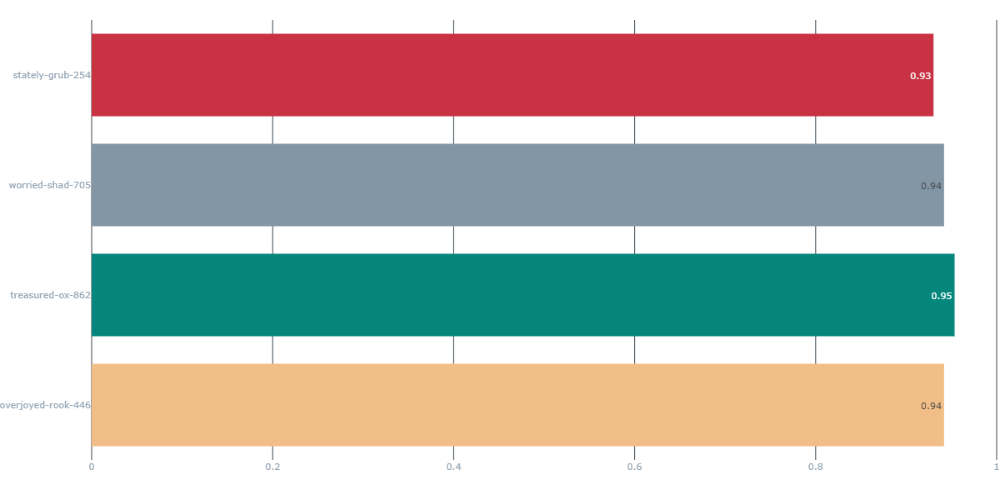

##### Precisão

> Proporção de verdadeiros positivos entre todas as previsões positivas.

> Importante para analisar se o custo de falsos positivos é alto.

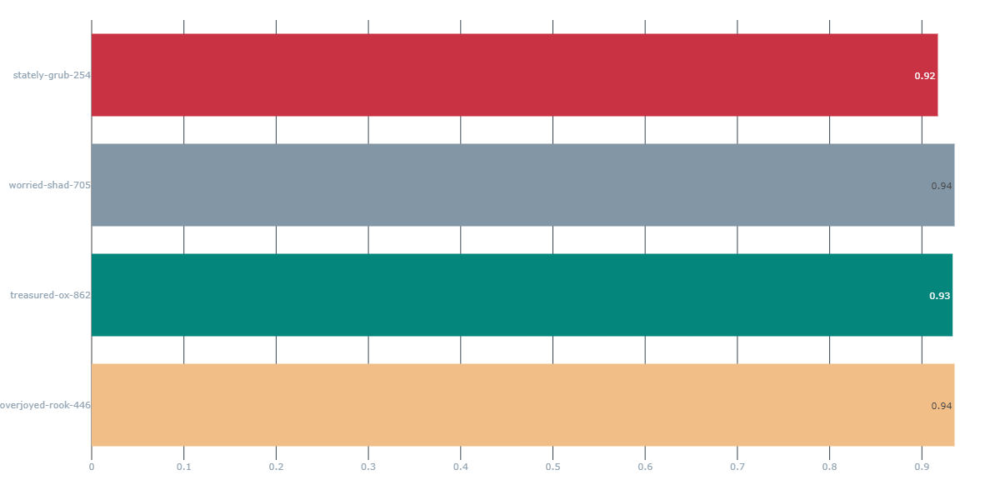

##### Recall

> Proporção de verdadeiros positivos entre todos os casos que realmente são positivos.

> Importante quando o custo de falsos negativos é alto.

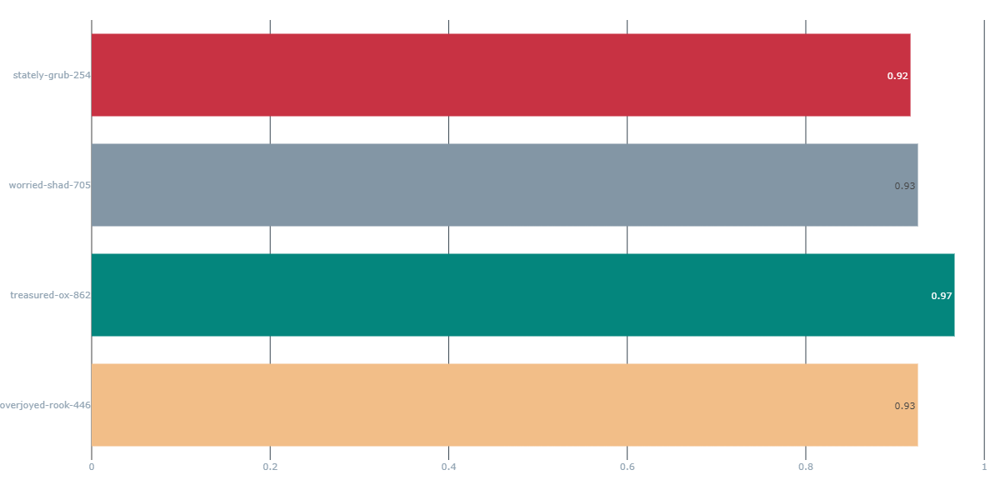

### LIME - LOCAL EXPLANATIONS
> 6. Realizar diagnóstico do melhor modelo geral da etapa 5 e melhorá-lo a partir do diagnóstico.

Nesta análise, exploraremos o uso de uma técnica importante para interpretar o modelo de Regressão Logística (nosso melhor modelo como vimos anteriormente) aplicado ao nosso dataset. Essa abordagem nos ajudará a compreender melhor como nosso modelo está tomando decisões e quais características são mais relevantes para a predição de diagnósticos de câncer de mama.

In [ ]:
pip install lime

In [ ]:
from lime import lime_tabular

# Criando o explicador
explainer = lime_tabular.LimeTabularExplainer(X_train.values,
                                                   feature_names= X_train.columns,
                                                   class_names= ["B","M"],
                                                   discretize_continuous=False)

In [ ]:
X_test

,texture_mean,area_mean,smoothness_mean,concavity_mean,symmetry_mean,fractal_dimension_mean,texture_se,area_se,smoothness_se,concavity_se,symmetry_se,fractal_dimension_se,smoothness_worst,concavity_worst,symmetry_worst,fractal_dimension_worst
140,11.97,288.5,0.09250,0.000000,0.1903,0.06422,0.4960,12.26,0.006040,0.000000,0.02277,0.003220,0.12340,0.000000,0.3105,0.08151
464,18.22,537.3,0.07466,0.048590,0.1454,0.05549,0.6850,16.89,0.005969,0.015640,0.01093,0.001672,0.12820,0.187600,0.2235,0.06925
320,16.18,324.2,0.10610,0.067260,0.1743,0.07279,1.4710,22.68,0.010490,0.040040,0.02719,0.007596,0.14020,0.189800,0.2608,0.09702
199,20.22,642.7,0.09872,0.118000,0.1950,0.06466,0.6509,19.42,0.004044,0.020000,0.01522,0.001976,0.15520,0.496700,0.4753,0.10130
568,24.54,181.0,0.05263,0.000000,0.1587,0.05884,1.4280,19.15,0.007189,0.000000,0.02676,0.002783,0.08996,0.000000,0.2871,0.07039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,10.94,559.2,0.12910,0.068770,0.2403,0.06641,1.0140,32.65,0.013400,0.011620,0.02572,0.006164,0.14510,0.085390,0.2710,0.07191
425,21.28,307.3,0.08117,0.002470,0.1630,0.06439,1.3410,11.60,0.005724,0.002074,0.01445,0.002411,0.11260,0.012350,0.2349,0.08061
117,16.67,682.5,0.11620,0.169000,0.2157,0.06768,0.9489,41.18,0.006985,0.030110,0.01602,0.003884,0.18780,0.470400,0.3585,0.10650
333,14.78,390.0,0.08306,0.000974,0.1773,0.06081,0.9961,15.07,0.005617,0.000974,0.01700,0.002030,0.11660,0.005518,0.2815,0.07418


In [ ]:
# Escolha o index da base de dados X_test que se quer explicar
indices = [0,11,22,33,44]

# Verificando as informações desse vinho
#print(X_test.iloc[i,:])
for i in indices:
    print(f"Informações para o índice {i}:")
    print(X_test.iloc[i, :])
    print("\n")

Informações para o índice 0:
texture_mean                11.97000
area_mean                  288.50000
smoothness_mean              0.09250
concavity_mean               0.00000
symmetry_mean                0.19030
fractal_dimension_mean       0.06422
texture_se                   0.49600
area_se                     12.26000
smoothness_se                0.00604
concavity_se                 0.00000
symmetry_se                  0.02277
fractal_dimension_se         0.00322
smoothness_worst             0.12340
concavity_worst              0.00000
symmetry_worst               0.31050
fractal_dimension_worst      0.08151
Name: 140, dtype: float64


Informações para o índice 11:
texture_mean                19.86000
area_mean                  337.70000
smoothness_mean              0.10700
concavity_mean               0.04831
symmetry_mean                0.17370
fractal_dimension_mean       0.06440
texture_se                   2.61200
area_se                     23.22000
smoothness_se            

In [ ]:
for i in indices:
  print(f"Informações para o índice {i}:")
  exp = explainer.explain_instance(X_test.iloc[i,:], rf.predict_proba, num_features= 10, top_labels = 0)

  exp.show_in_notebook(show_table=True, show_all=False)
  print("\n")

Informações para o índice 0:


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names





Informações para o índice 11:


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names





Informações para o índice 22:


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names





Informações para o índice 33:


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names





Informações para o índice 44:


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



O LIME é projetado para fornecer explicações locais, ou seja, explicações para previsões específicas do modelo para instâncias individuais. Oferecendo insights sobre como o modelo chegou a essa previsão.

> Assim, percebemos que as áreas e as concavidades (principalmente as áreas) mais altas tem um influência considerável na predição individual desses exemplos para células malignas.

Agora baseados no LIME, vamos selecionar os recursos mais relevantes afim de reduzir o número de features e melhorar a explicabilidade do nosso modelo. Os recursos escolhidos são: area_mean, area_se, concavity_worst, concavity_mean, texture_mean, symmetry_worst, smoothness_worst.

In [ ]:
X1 = dataset.drop(['diagnosis'], axis=1)

X1_drop = ['perimeter_mean','radius_mean','compactness_mean','concave points_mean','smoothness_mean','symmetry_mean','fractal_dimension_mean',
            'texture_se','radius_se','perimeter_se','compactness_se','concave points_se','smoothness_se','concavity_se','symmetry_se','fractal_dimension_se',
            'perimeter_worst','compactness_worst','fractal_dimension_worst']

X1_fs = X1.drop(X1_drop,axis = 1 )
X1_fs.head()

,texture_mean,area_mean,concavity_mean,area_se,radius_worst,texture_worst,area_worst,smoothness_worst,concavity_worst,concave points_worst,symmetry_worst
0,10.38,1001.0,0.3001,153.40,25.38,17.33,2019.0,0.1622,0.7119,0.2654,0.4601
1,17.77,1326.0,0.0869,74.08,24.99,23.41,1956.0,0.1238,0.2416,0.1860,0.2750
2,21.25,1203.0,0.1974,94.03,23.57,25.53,1709.0,0.1444,0.4504,0.2430,0.3613
3,20.38,386.1,0.2414,27.23,14.91,26.50,567.7,0.2098,0.6869,0.2575,0.6638
4,14.34,1297.0,0.1980,94.44,22.54,16.67,1575.0,0.1374,0.4000,0.1625,0.2364


In [ ]:
X1_train, X1_test, Y1_train, Y1_test = train_test_split(X1_fs, Y, test_size=0.30, random_state=42)

lr1 = lr = LogisticRegression(penalty='l2', C=2963.77, solver='lbfgs', random_state=42)
lr1.fit(X1_train, Y1_train)

Yhat1_lr = lr1.predict(X1_test)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [ ]:
metrics = pd.DataFrame(index = ['lr','lr_sel'], columns = ['Acc','Prec','Rec'])

metrics.at['lr','Acc'] = accuracy_score(Y_test,Yhat_lr)
metrics.at['lr_sel','Acc'] = accuracy_score(Y1_test,Yhat1_lr)

metrics.at['lr','Prec'] = precision_score(Y_test,Yhat_lr,pos_label='M')
metrics.at['lr_sel','Prec'] = precision_score(Y1_test,Yhat1_lr,pos_label='M')

metrics.at['lr','Rec'] = recall_score(Y_test,Yhat_lr,pos_label='M')
metrics.at['lr_sel','Rec'] = recall_score(Y1_test,Yhat1_lr,pos_label='M')


metrics

,Acc,Prec,Rec
lr,0.976744,0.928571,1.0
lr_sel,0.976608,0.983607,0.952381


Agora temos um modelo que possui muito menos recursos e, portanto, é muito mais fácil de explicar. Além de possuir métricas muito semelhantes ao modelo com mais features.